## 1. Зниження розмірності та візуалізація

In [205]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns

In [206]:
dsr= pd.read_csv('Paris.csv',encoding="ISO-8859-1")

In [207]:
print(dsr.head())

   squareMeters  numberOfRooms  hasYard  hasPool  floors  cityCode  \
0         75523              3        0        1      63      9373   
1         80771             39        1        1      98     39381   
2         55712             58        0        1      19     34457   
3         32316             47        0        0       6     27939   
4         70429             19        1        1      90     38045   

   cityPartRange  numPrevOwners  made  isNewBuilt  hasStormProtector  \
0              3              8  2005           0                  1   
1              8              6  2015           1                  0   
2              6              8  2021           0                  0   
3             10              4  2012           0                  1   
4              3              7  1990           1                  0   

   basement  attic  garage  hasStorageRoom  hasGuestRoom      price category  
0      4313   9005     956               0             7  7559081.5

In [208]:
columns = dsr.columns[6:10]
x = dsr.loc[:,columns].values
print(x)

[[   3    8 2005    0]
 [   8    6 2015    1]
 [   6    8 2021    0]
 ...
 [  10   10 2005    1]
 [   1    3 2010    0]
 [   6   10 1994    1]]


## PCA

In [209]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(x)
pca_data = pd.DataFrame(data = pca_result, columns = ['pca1', 'pca2'])

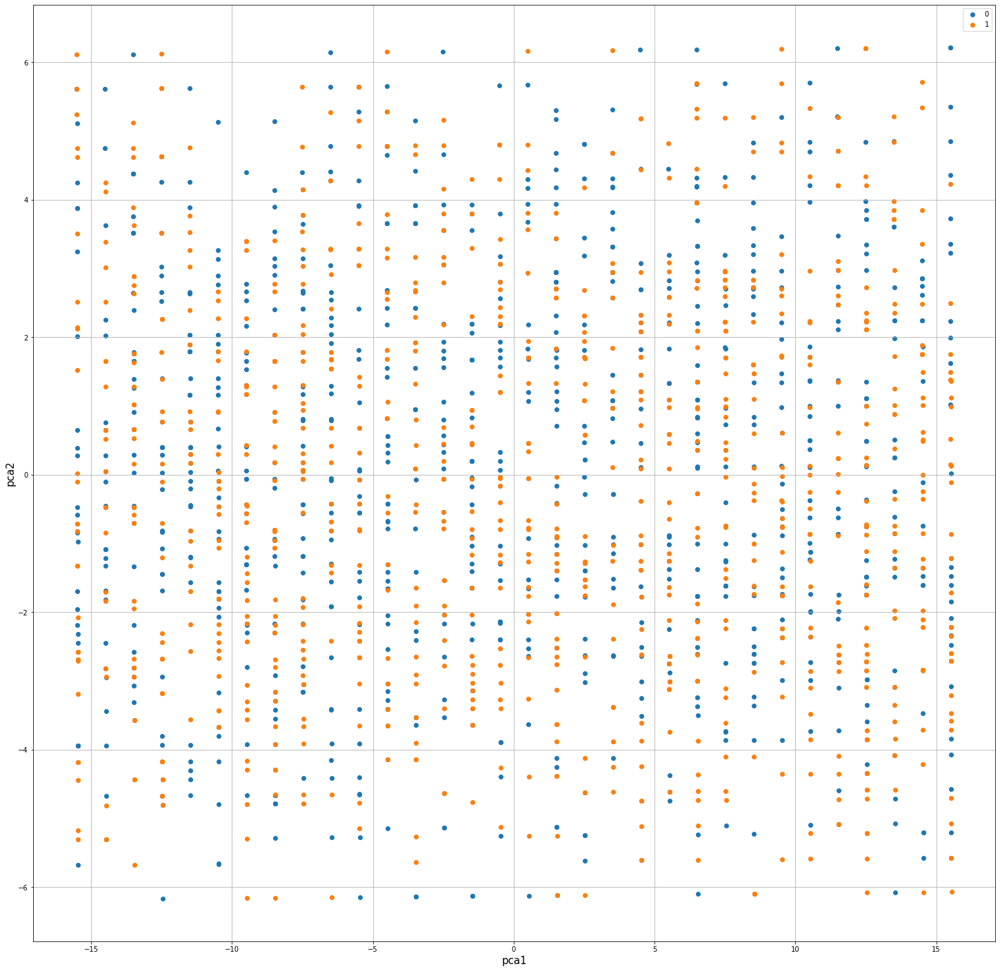

In [210]:
figure = plt.figure(figsize = (25,25))
ax = figure.add_subplot(111) 
ax.set_xlabel('pca1', fontsize = 15)
ax.set_ylabel('pca2', fontsize = 15)
targets = [0,1]
for target in zip(targets):
    index = dsr['hasGuestRoom'] == target
    ax.scatter(pca_data.loc[index, 'pca1'], pca_data.loc[index, 'pca2'])
ax.legend(targets)
ax.grid()
plt.show()

## t-SNE


In [211]:
columns = dsr.columns[6:10]
y = dsr.loc[:,columns].values
print(y)

[[   3    8 2005    0]
 [   8    6 2015    1]
 [   6    8 2021    0]
 ...
 [  10   10 2005    1]
 [   1    3 2010    0]
 [   6   10 1994    1]]


In [212]:
tsne = TSNE(n_components=2, perplexity=40, n_iter=500)
neighbors = tsne.fit_transform(StandardScaler().fit_transform(y)) 
neighbors_data =  pd.DataFrame(data = neighbors, columns = ['tsne1', 'tsne2'])
print(neighbors_data)

C:\Users\kateh\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\kateh\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


          tsne1      tsne2
0     -5.612707   3.601506
1     12.133354  29.135077
2    -12.526391 -14.341414
3    -37.072666  -7.819176
4     18.890120 -34.081963
...         ...        ...
9995 -25.736454 -10.938633
9996 -37.893116 -21.021765
9997  19.348577  18.849083
9998 -18.110329  27.095329
9999  18.833214   9.852143

[10000 rows x 2 columns]


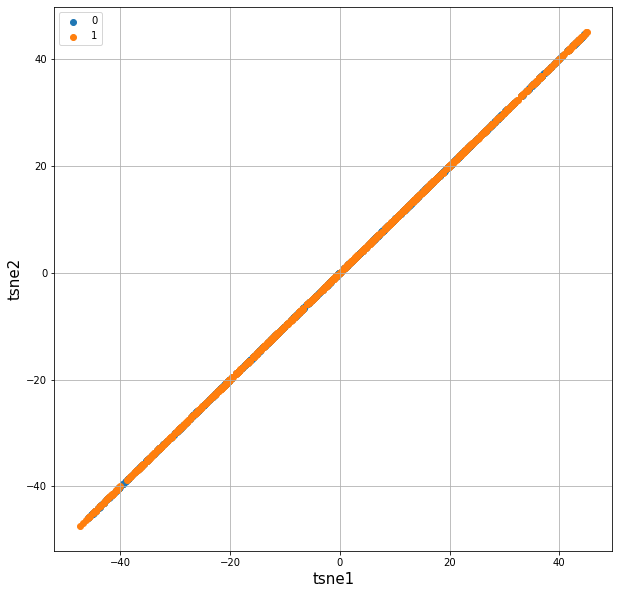

In [213]:
figure = plt.figure(figsize = (10,10))
ax = figure.add_subplot(111) 
ax.set_xlabel('tsne1', fontsize = 15)
ax.set_ylabel('tsne2', fontsize = 15)
targets1 = [0,1]
for target in zip(targets1):
    index = dsr['hasGuestRoom'] == target
    ax.scatter(neighbors_data.loc[index, 'tsne1'], neighbors_data.loc[index, 'tsne1'])
ax.legend(targets1)
ax.grid()
plt.show()

## Кластерний аналіз

## Квантування зображення за допомогою k-means

In [214]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.utils import shuffle
from PIL import Image

In [215]:
def recreate_image(codebook, labels, w, h):
    return codebook[labels].reshape(w, h, -1)

In [216]:
num_colors = [64, 32, 16, 8]

In [217]:
masha = Image.open('masha.jpg')
masha = np.array(masha, dtype=np.float64) / 255

In [218]:
w, h, d = original_shape = tuple(masha.shape)
assert d == 3
image_array = np.reshape(masha, (w * h, d))

models = []
for colors in num_colors:
    kmeans = KMeans(n_clusters=colors).fit(img_subsample)
    models.append(kmeans)

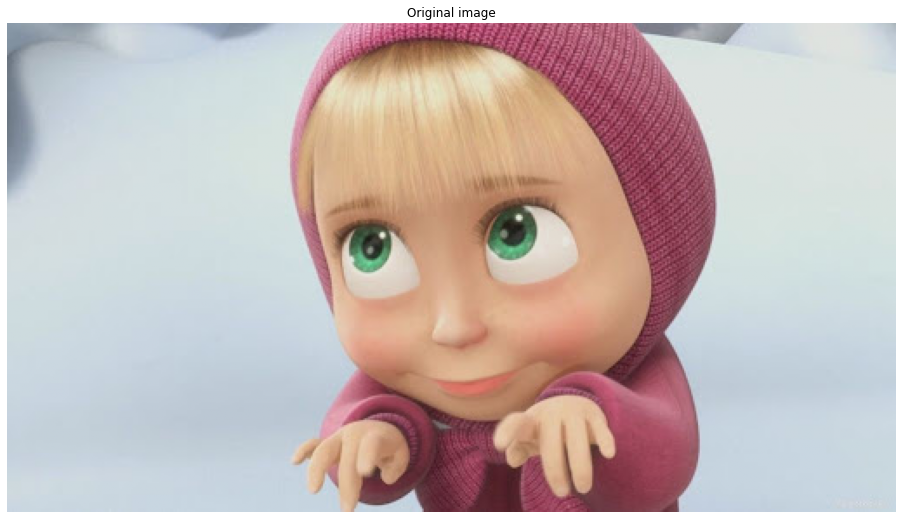

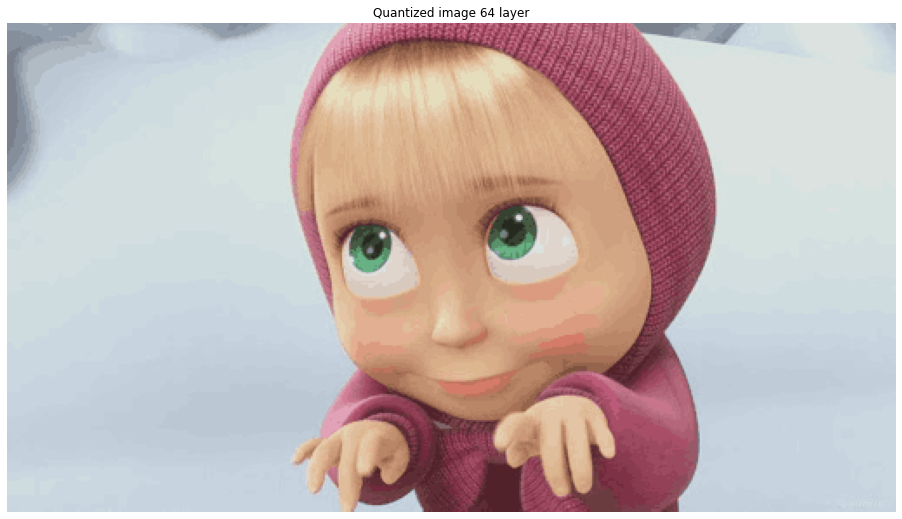

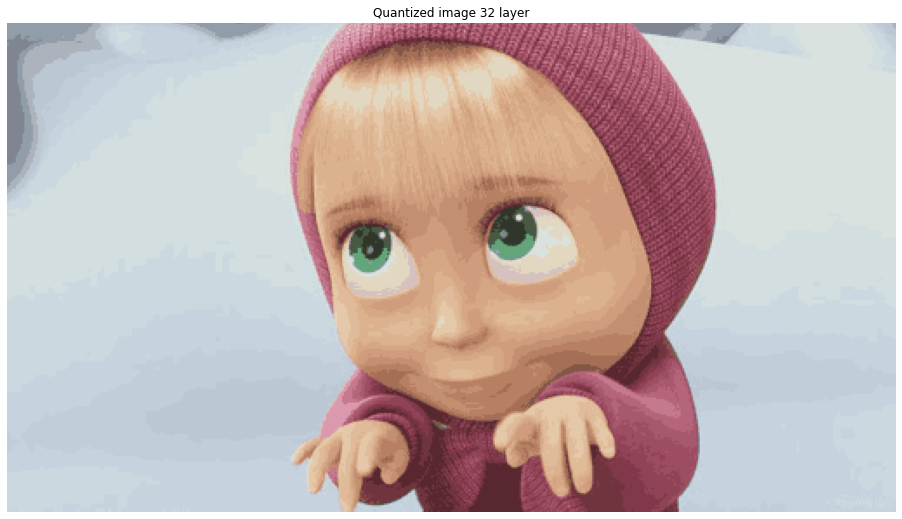

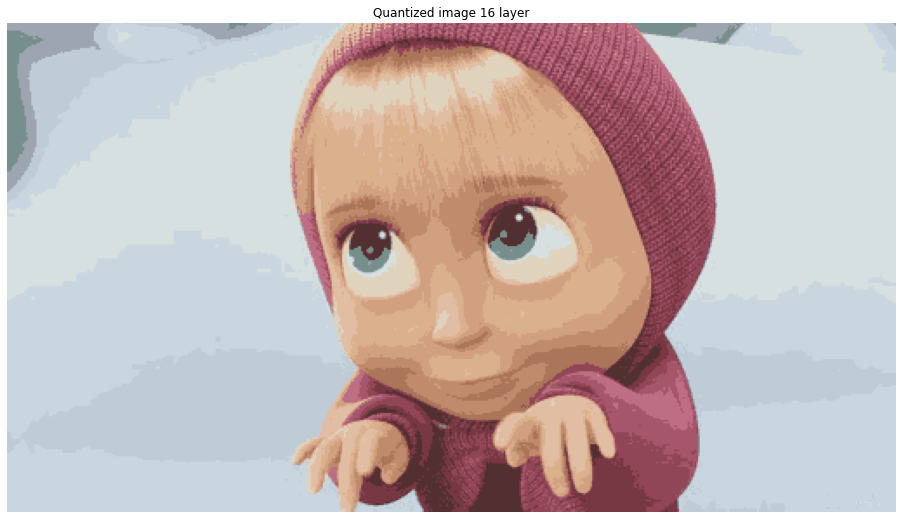

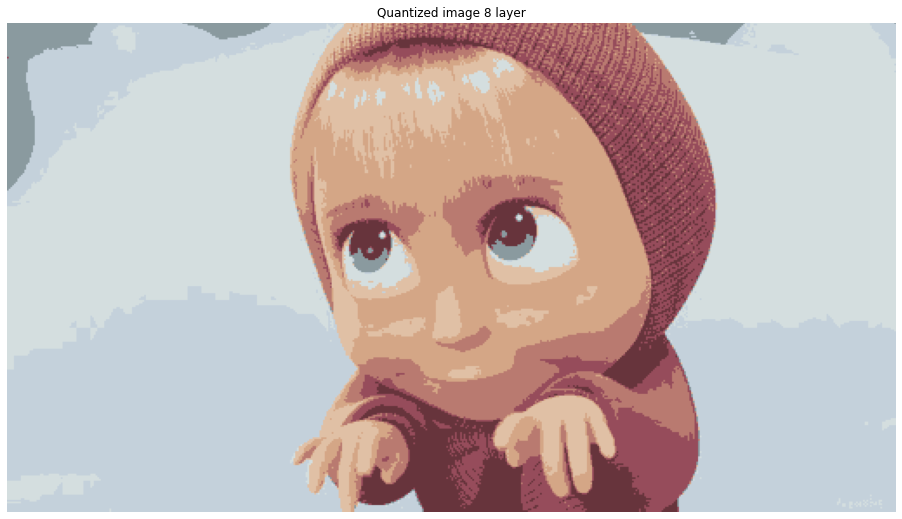

In [219]:
plt.figure(figsize=(16,9))
plt.axis('off')
plt.title('Original image')
plt.imshow(image) 

for model in models:
    labels = model.predict(image_array)
    plt.figure(figsize=(16,9))
    plt.clf()
    plt.axis('off')
    plt.title(f'Quantized image {model.get_params().get("n_clusters")} layer')
    plt.imshow(recreate_image(model.cluster_centers_, labels, w, h))

## Silhouette analysis

In [273]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

In [274]:
mean_1 = [1, -2]
cov_1 = [[1, 0], [0, 1]]
x_1 = np.random.multivariate_normal(mean_1, cov_1, 2000)

mean_2 = [0, 0]
cov_2 = [[7, -2], [-2, 3]]
x_2 = np.random.multivariate_normal(mean_2, cov_2, 2000)

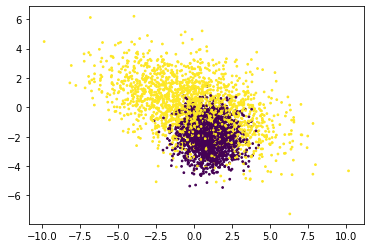

In [275]:
x = np.concatenate([x_1, x_2])
y = np.array([0] * 2000 + [1] * 2000) 
x, y = shuffle(x, y, random_state=0)
plt.scatter(x[:, 0], x[:, 1], s = 3, c = y)
plt.show()

In [286]:
GMM = GaussianMixture(n_components=2, covariance_type='full')
GMM.fit(x)
print('weights_ ')
print(GMM.weights_)
print('covariances_ ')
print(GMM.covariances_)
print('means_ ')
print(GMM.means_)

weights_ 
[0.39567492 0.60432508]
covariances_ 
[[[ 8.39645281 -2.30375124]
  [-2.30375124  2.89034482]]

 [[ 1.32715683 -0.14067458]
  [-0.14067458  1.2110833 ]]]
means_ 
[[-0.20802897  0.33178235]
 [ 0.94049274 -1.85467408]]


In [287]:
labels = GMM.predict(x)

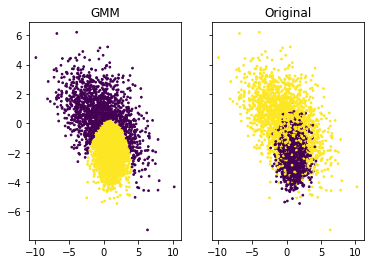

In [290]:
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
ax1.set_title('GMM')
ax1.scatter(x[:,0], x[:,1], c=labels, s=3)
ax2.set_title("Original")
ax2.scatter(x[:,0], x[:,1], c=y, s=3)

In [92]:
import re 
import string
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import CountVectorizer

In [93]:
apple = pd.read_csv('APPLE_iPhone_SE.csv',encoding="ISO-8859-1")

In [94]:
print(apple.head())

   Ratings         Comment                                            Reviews
0        5          Super!  Great camera for pics and videos Battery life ...
1        5       Must buy!  Great device. Let me tell the Pros..1. Superb ...
2        5   Great product  Who all loves older size i.e., 4.7 inch type s...
3        5  Simply awesome  This iPhone SE is the best phone ever you get....
4        5  Classy product  This is my second iphone after iphone 4s. Iâ...


In [95]:
apple['Ratings'].replace(1, 'very bad score',inplace=True)
apple['Ratings'].replace(2, 'bad score',inplace=True)
apple['Ratings'].replace(3, 'average score',inplace=True)
apple['Ratings'].replace(4, 'good score',inplace=True)
apple['Ratings'].replace(5, 'very good score',inplace=True)

In [96]:
print(apple)

              Ratings            Comment  \
0     very good score             Super!   
1     very good score          Must buy!   
2     very good score      Great product   
3     very good score     Simply awesome   
4     very good score     Classy product   
...               ...                ...   
9708  very good score  Terrific purchase   
9709  very good score     Classy product   
9710  very good score            Awesome   
9711  very good score             Super!   
9712  very good score  Terrific purchase   

                                                Reviews  
0     Great camera for pics and videos Battery life ...  
1     Great device. Let me tell the Pros..1. Superb ...  
2     Who all loves older size i.e., 4.7 inch type s...  
3     This iPhone SE is the best phone ever you get....  
4     This is my second iphone after iphone 4s. Iâ...  
...                                                 ...  
9708                      Absolutely brilliantREAD MORE  
9709  S

In [97]:
apple.drop('Comment', axis=1, inplace=True)

In [108]:
apple['Reviews'] = apple['Reviews'].str.lower()
p = re.compile(r'[^\w\s]+')
apple['Reviews'] = [p.sub('', x) for x in apple['Reviews'].tolist()]
apple['Reviews'] = apple['Reviews'].str.replace('<br />','', regex=True)

In [109]:
print(apple)

              Ratings                                            Reviews
0     very good score  great camera pics videos battery life good far...
1     very good score  great device let tell pros1 superb build quali...
2     very good score  loves older size ie 47 inch type definitely go...
3     very good score  iphone se best phone ever get beautifully desi...
4     very good score  second iphone iphone 4s iâve long time android...
...               ...                                                ...
9708  very good score                           absolutely brilliantread
9709  very good score  superb phone 4th iphone feel se 2020is thinnes...
9710  very good score                                           niceread
9711  very good score                           loving good product read
9712  very good score                           niceelegant electricread

[9713 rows x 2 columns]


In [110]:
stop_words = stopwords.words('english')

In [111]:
apple['Reviews'] = apple['Reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

In [112]:
table = str.maketrans('', '', string.punctuation)
apple['Reviews'] = apple['Reviews'].str.translate(table)

In [113]:
print(apple)

              Ratings                                            Reviews
0     very good score  great camera pics videos battery life good far...
1     very good score  great device let tell pros1 superb build quali...
2     very good score  loves older size ie 47 inch type definitely go...
3     very good score  iphone se best phone ever get beautifully desi...
4     very good score  second iphone iphone 4s iâve long time android...
...               ...                                                ...
9708  very good score                           absolutely brilliantread
9709  very good score  superb phone 4th iphone feel se 2020is thinnes...
9710  very good score                                           niceread
9711  very good score                           loving good product read
9712  very good score                           niceelegant electricread

[9713 rows x 2 columns]


In [120]:
import matplotlib.pyplot as plt
def WC(text):
    wordcloud = WordCloud(width = 1500,height = 700,).generate(str(text))
    fig = plt.figure(figsize = (40, 30))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

### WordCloud відгуків з рейтингом 1

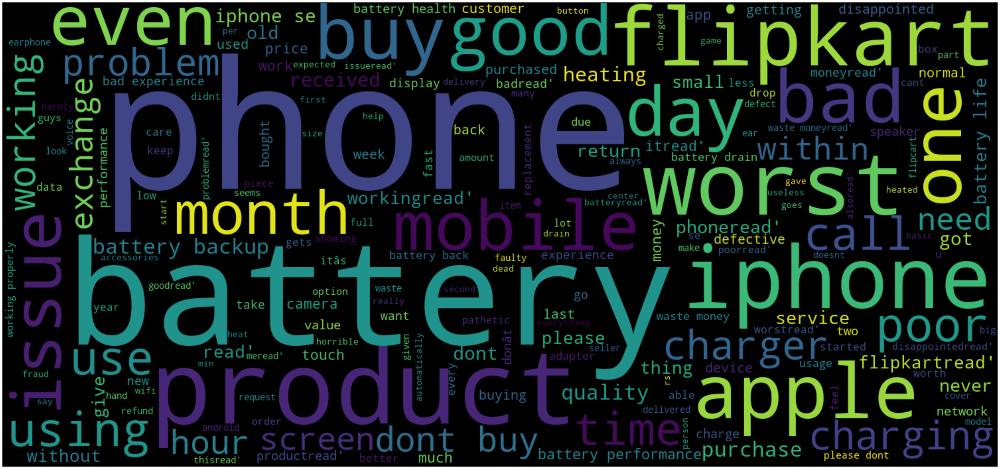

In [122]:
WC(apple[apple['Ratings']=='very bad score'].Reviews.values)

### WordCloud відгуків з рейтингом 2

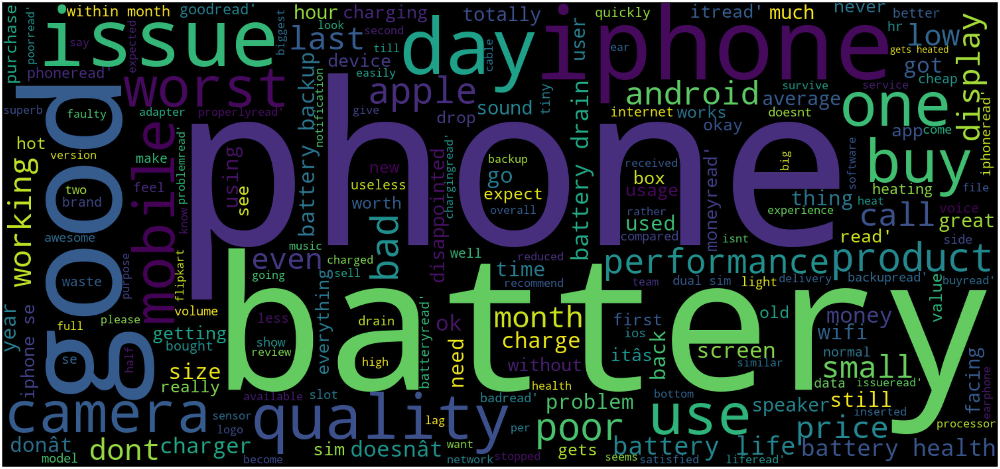

In [123]:
WC(apple[apple['Ratings']=='bad score'].Reviews.values)

### WordCloud відгуків з рейтингом 3

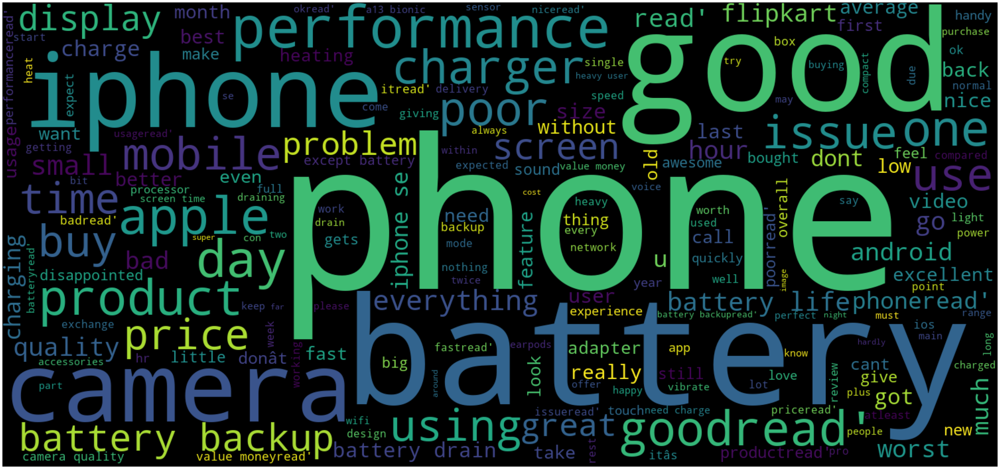

In [124]:
WC(apple[apple['Ratings']=='average score'].Reviews.values)

### WordCloud відгуків з рейтингом 4

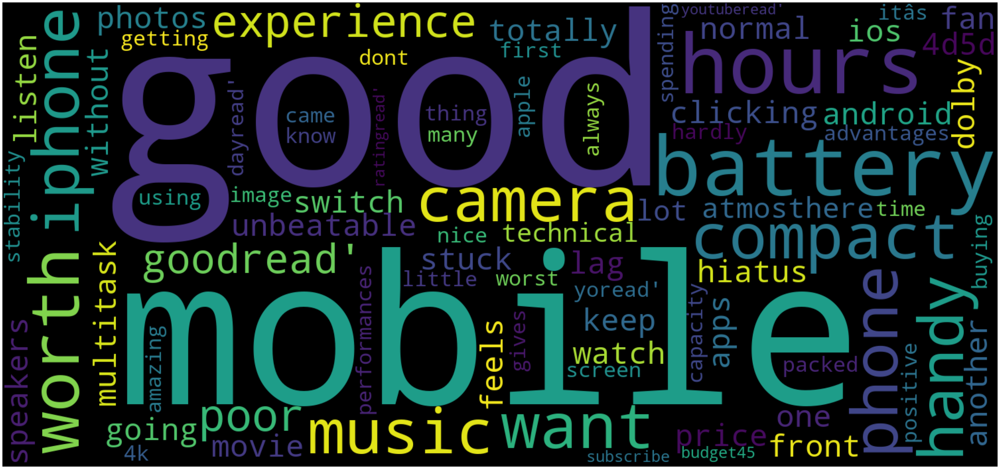

In [125]:
WC(apple[apple['Ratings']=='good score'].Reviews.values)

### WordCloud відгуків з рейтингом 5

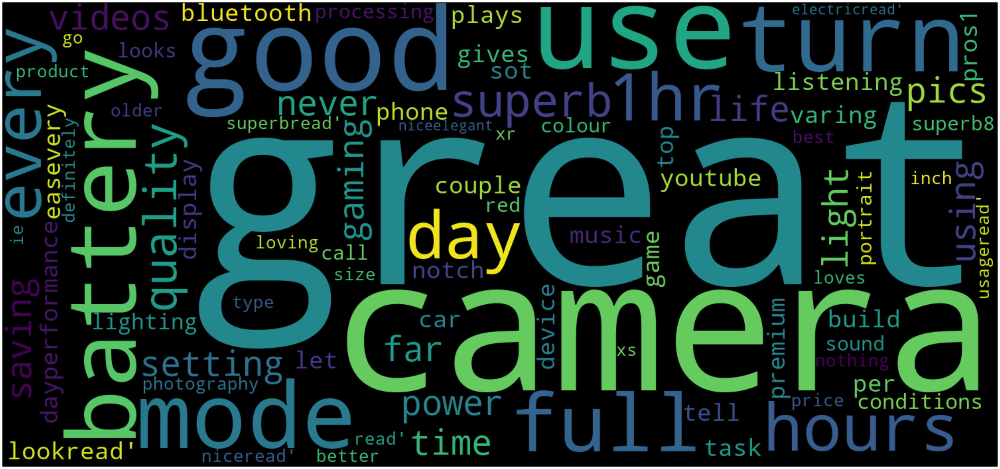

In [130]:
WC(apple[apple['Ratings']=='very good score'].Reviews.values)

In [128]:
X = TfidfVectorizer(max_features=8000).fit_transform(apple['Reviews'])
y = apple['Ratings']

In [129]:
X_train, X_test, y_train, y_test = train_test_split(X, y,train_size = 0.9, random_state = 1)
CART = DecisionTreeClassifier()
CART = CART.fit(X_train,y_train)
y_pred = CART.predict(X_test)
print(classification_report(y_test, y_pred))

                 precision    recall  f1-score   support

  average score       0.10      0.09      0.09        44
      bad score       0.00      0.00      0.00        19
     good score       0.33      0.19      0.24       215
 very bad score       0.29      0.29      0.29        42
very good score       0.74      0.85      0.79       652

       accuracy                           0.63       972
      macro avg       0.29      0.28      0.28       972
   weighted avg       0.58      0.63      0.60       972

